<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#EDA" data-toc-modified-id="EDA-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>EDA</a></span><ul class="toc-item"><li><span><a href="#Features" data-toc-modified-id="Features-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Features</a></span></li><li><span><a href="#Targets" data-toc-modified-id="Targets-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>Targets</a></span></li><li><span><a href="#Combined-analysis" data-toc-modified-id="Combined-analysis-1.3"><span class="toc-item-num">1.3&nbsp;&nbsp;</span>Combined analysis</a></span></li></ul></li></ul></div>

In [1]:
SEED = 12345
ITERATIONS = 3

In [2]:
import os

In [3]:
os.listdir('./datasets')

['messages.xlsx',
 'test_intervals.xlsx',
 'X_test.parquet',
 'X_train.parquet',
 'y_train.parquet',
 'ЭКСГАУСТЕР_4.parquet',
 'ЭКСГАУСТЕР_5.parquet',
 'ЭКСГАУСТЕР_6.parquet',
 'ЭКСГАУСТЕР_7.parquet',
 'ЭКСГАУСТЕР_8.parquet',
 'ЭКСГАУСТЕР_9.parquet',
 'ЭКСГАУСТЕР_АМ_№4.parquet',
 'ЭКСГАУСТЕР_АМ_№5.parquet',
 'ЭКСГАУСТЕР_АМ_№6.parquet',
 'ЭКСГАУСТЕР_АМ_№7.parquet',
 'ЭКСГАУСТЕР_АМ_№8.parquet',
 'ЭКСГАУСТЕР_АМ_№9.parquet']

In [4]:
!python --version

Python 3.10.9


In [79]:
import pandas as pd
import pyarrow as pa
import pyarrow.csv as csv
import pyarrow.parquet as pq
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import phik
from tqdm import tqdm
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split, TimeSeriesSplit, cross_val_score
from sklearn.linear_model import LogisticRegression
from catboost import CatBoostClassifier

In [6]:
features = pq.read_table('./datasets/ЭКСГАУСТЕР_8.parquet').to_pandas()
features.head(3)

,ЭКСГАУСТЕР 8. ТОК РОТОРА 1,ЭКСГАУСТЕР 8. ТОК РОТОРА 2,ЭКСГАУСТЕР 8. ТОК СТАТОРА,ЭКСГАУСТЕР 8. ДАВЛЕНИЕ МАСЛА В СИСТЕМЕ,ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА ПОДШИПНИКА НА ОПОРЕ 1,ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА ПОДШИПНИКА НА ОПОРЕ 2,ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА ПОДШИПНИКА НА ОПОРЕ 3,ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА ПОДШИПНИКА НА ОПОРЕ 4,ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА МАСЛА В СИСТЕМЕ,ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА МАСЛА В МАСЛОБЛОКЕ,ЭКСГАУСТЕР 8. ВИБРАЦИЯ НА ОПОРЕ 1,ЭКСГАУСТЕР 8. ВИБРАЦИЯ НА ОПОРЕ 2,ЭКСГАУСТЕР 8. ВИБРАЦИЯ НА ОПОРЕ 3,ЭКСГАУСТЕР 8. ВИБРАЦИЯ НА ОПОРЕ 3. ПРОДОЛЬНАЯ.,ЭКСГАУСТЕР 8. ВИБРАЦИЯ НА ОПОРЕ 4,ЭКСГАУСТЕР 8. ВИБРАЦИЯ НА ОПОРЕ 4. ПРОДОЛЬНАЯ.
DT,,,,,,,,,,,,,,,,
2019-01-16 13:21:00,1.45,1.45,0.0,4.940000,29.210000,29.210000,28.390000,28.80,23.530000,25.960000,0.100000,0.070000,0.030000,0.270000,0.060000,0.300000
2019-01-16 13:21:10,1.74,1.74,0.0,5.130000,28.881099,29.367858,28.962225,27.58,23.283353,26.122788,0.085069,0.053819,0.034722,0.228299,0.050347,0.302083
2019-01-16 13:21:20,1.16,1.16,0.0,5.283333,29.115464,29.476026,28.935183,28.39,23.436592,26.411239,0.075231,0.045332,0.031829,0.227623,0.053048,0.289352


In [7]:
targets = pq.read_table('./datasets/ЭКСГАУСТЕР_АМ_№8.parquet').to_pandas()
targets.head(3)

,Y_ЭКСГАУСТЕР А/М №8_РОТОР ЭКСГ. №8,Y_ЭКСГАУСТЕР А/М №8_ЭЛЕКТРОДВИГАТЕЛЬ ДСПУ-140-84-4 ЭКСГ. №8,Y_ЭКСГАУСТЕР А/М №8_КОРПУС ЭКСГ. №8,Y_ЭКСГАУСТЕР А/М №8_РЕДУКТОР ГАЗ. ЗАДВИЖКИ ЭКСГ. №8,Y_ЭКСГАУСТЕР А/М №8_ВК 310С ВИБРОПРЕОБРАЗОВАТЕЛЬ ЭКСГ.№8 Т.3,Y_ЭКСГАУСТЕР А/М №8_ВК 310С ВИБРОПРЕОБРАЗОВАТЕЛЬ ЭКСГ.№8 Т.4,Y_ЭКСГАУСТЕР А/М №8_ЭЛ/ДВИГАТЕЛЬ ГАЗ. ЗАДВИЖКИ ЭКСГ. №8,Y_ЭКСГАУСТЕР А/М №8_МАСЛООХЛАДИТЕЛЬ М-05-1 ЭКСГ. №8,Y_ЭКСГАУСТЕР А/М №8_ТИРИСТОРНЫЙ ВОЗБУДИТЕЛЬ СПВД-М10-400-5,Y_ЭКСГАУСТЕР А/М №8_КЛ2 ТР№8 ДО ЭД ЭКСГАУСТЕРА №8,...,Y_ЭКСГАУСТЕР А/М №8_ЭЛЕКТРООБОРУДОВАНИЯ ЭКСГАУСТЕРА №8,Y_ЭКСГАУСТЕР А/М №8_ПОДШИПНИК ОПОРНЫЙ ЭКСГ. №8,Y_ЭКСГАУСТЕР А/М №8_ЗАДВИЖКА ЭКСГ. №8,Y_ЭКСГАУСТЕР А/М №8_МАСЛОНАСОС РАБОЧИЙ ЭКСГ. №8,Y_ЭКСГАУСТЕР А/М №8_МАСЛОНАСОС ШЕСТЕРЕНЧАТЫЙ (РЕЗ.) ЭКСГ. №8,Y_ЭКСГАУСТЕР А/М №8_МАСЛОНАСОС ШЕСТЕРЕНЧАТЫЙ (ПУСК.) ЭКСГ.№8,Y_ЭКСГАУСТЕР А/М №8_ВК 310С ВИБРОПРЕОБРАЗОВАТЕЛЬ ЭКСГ.№8 Т.2,Y_ЭКСГАУСТЕР А/М №8_ТР-Р ТМ-6300-10/6 ЭКСГ. №8,Y_ЭКСГАУСТЕР А/М №8_ПОДШИПНИК ОПОРНО-УПОРНЫЙ ЭКСГ. №8,Y_ЭКСГАУСТЕР А/М №8_МАСЛОПРОВОДЫ ЭКСГАУСТЕРА №8
DT,,,,,,,,,,,,,,,,,,,,,
2019-01-16 13:21:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2019-01-16 13:21:10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2019-01-16 13:21:20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## EDA

### Features

In [8]:
features.columns

Index(['ЭКСГАУСТЕР 8. ТОК РОТОРА 1', 'ЭКСГАУСТЕР 8. ТОК РОТОРА 2',
       'ЭКСГАУСТЕР 8. ТОК СТАТОРА', 'ЭКСГАУСТЕР 8. ДАВЛЕНИЕ МАСЛА В СИСТЕМЕ',
       'ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА ПОДШИПНИКА НА ОПОРЕ 1',
       'ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА ПОДШИПНИКА НА ОПОРЕ 2',
       'ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА ПОДШИПНИКА НА ОПОРЕ 3',
       'ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА ПОДШИПНИКА НА ОПОРЕ 4',
       'ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА МАСЛА В СИСТЕМЕ',
       'ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА МАСЛА В МАСЛОБЛОКЕ',
       'ЭКСГАУСТЕР 8. ВИБРАЦИЯ НА ОПОРЕ 1',
       'ЭКСГАУСТЕР 8. ВИБРАЦИЯ НА ОПОРЕ 2',
       'ЭКСГАУСТЕР 8. ВИБРАЦИЯ НА ОПОРЕ 3',
       'ЭКСГАУСТЕР 8. ВИБРАЦИЯ НА ОПОРЕ 3. ПРОДОЛЬНАЯ.',
       'ЭКСГАУСТЕР 8. ВИБРАЦИЯ НА ОПОРЕ 4',
       'ЭКСГАУСТЕР 8. ВИБРАЦИЯ НА ОПОРЕ 4. ПРОДОЛЬНАЯ.'],
      dtype='object')

array([[<Axes: title={'center': 'ЭКСГАУСТЕР 8. ТОК РОТОРА 1'}>,
        <Axes: title={'center': 'ЭКСГАУСТЕР 8. ТОК РОТОРА 2'}>,
        <Axes: title={'center': 'ЭКСГАУСТЕР 8. ТОК СТАТОРА'}>,
        <Axes: title={'center': 'ЭКСГАУСТЕР 8. ДАВЛЕНИЕ МАСЛА В СИСТЕМЕ'}>],
       [<Axes: title={'center': 'ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА ПОДШИПНИКА НА ОПОРЕ 1'}>,
        <Axes: title={'center': 'ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА ПОДШИПНИКА НА ОПОРЕ 2'}>,
        <Axes: title={'center': 'ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА ПОДШИПНИКА НА ОПОРЕ 3'}>,
        <Axes: title={'center': 'ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА ПОДШИПНИКА НА ОПОРЕ 4'}>],
       [<Axes: title={'center': 'ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА МАСЛА В СИСТЕМЕ'}>,
        <Axes: title={'center': 'ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА МАСЛА В МАСЛОБЛОКЕ'}>,
        <Axes: title={'center': 'ЭКСГАУСТЕР 8. ВИБРАЦИЯ НА ОПОРЕ 1'}>,
        <Axes: title={'center': 'ЭКСГАУСТЕР 8. ВИБРАЦИЯ НА ОПОРЕ 2'}>],
       [<Axes: title={'center': 'ЭКСГАУСТЕР 8. ВИБРАЦИЯ НА ОПОРЕ 3'}>,
        <Axes: t

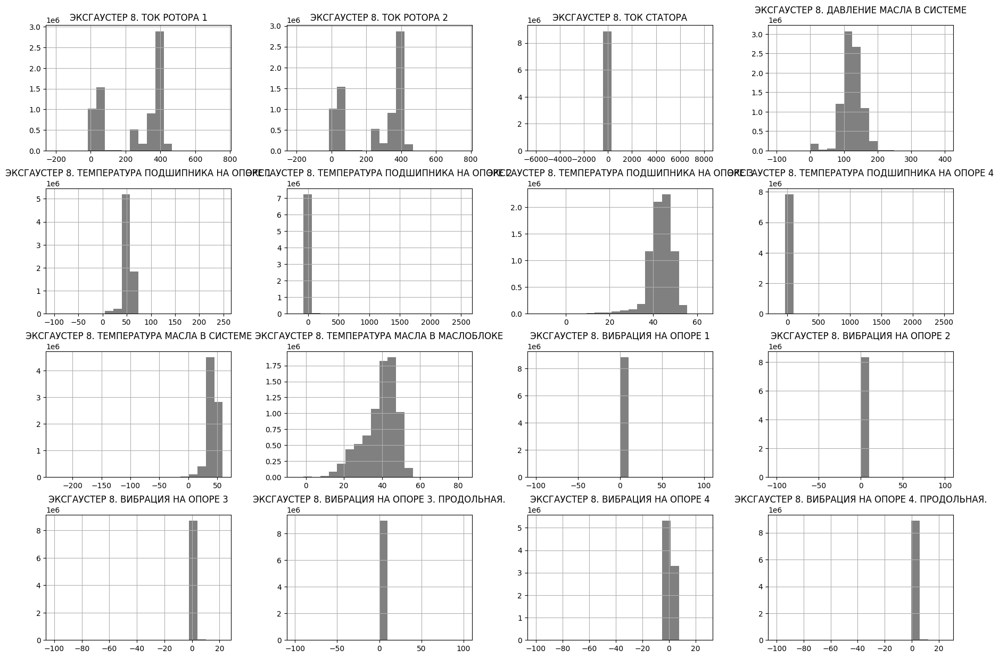

In [9]:
features.hist(figsize=(22, 15),
              color='grey',
              bins=20)

In [10]:
%%time
correlations_pearson_features = features.corr()

CPU times: total: 3.8 s
Wall time: 4.68 s


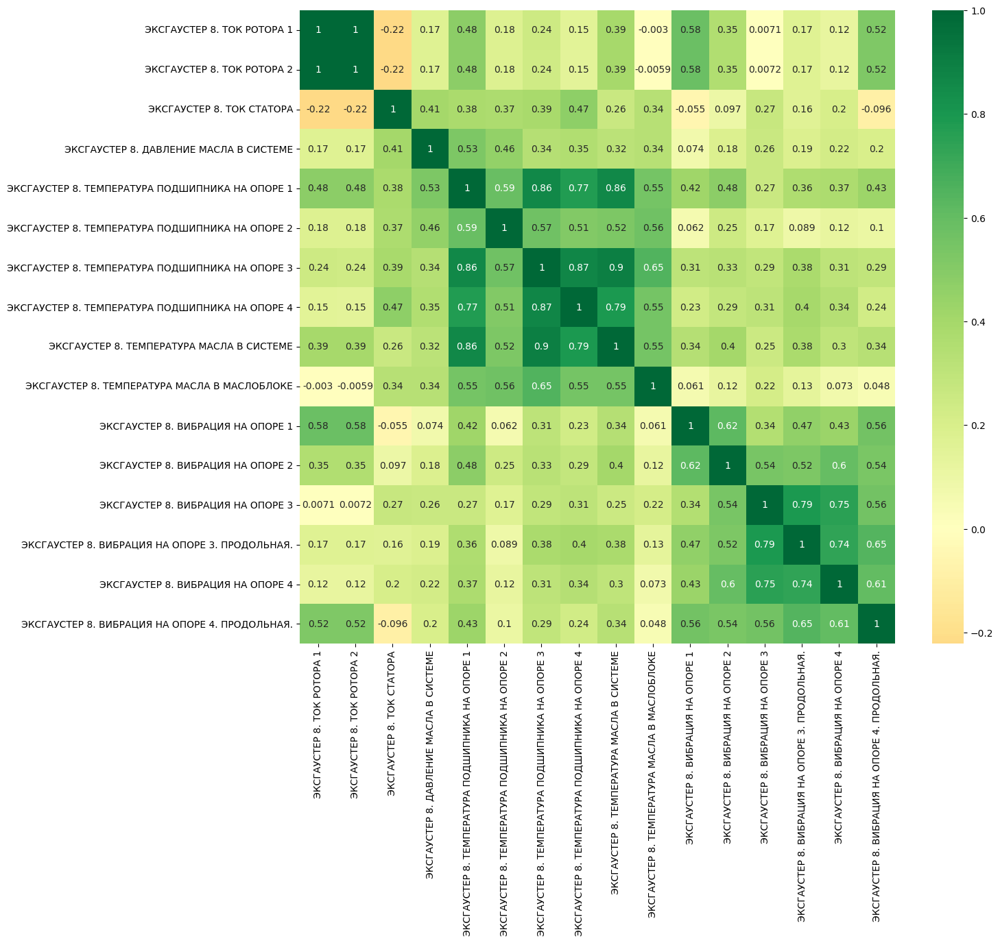

In [11]:
plt.figure(figsize=(14, 12))
sns.heatmap(correlations_pearson_features,
            cmap='RdYlGn',
            center=0,
            annot=True);

In [12]:
upper_features = correlations_pearson_features.where(np.triu(np.ones(correlations_pearson_features.shape), k=1).astype(np.bool_))
high_corr_features = upper_features.stack()[abs(upper_features.stack()) > 0.8]

In [13]:
correlated_features = set()
for idx in high_corr_features.index:
    correlated_features.add(idx[1])
correlated_features

{'ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА МАСЛА В СИСТЕМЕ',
 'ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА ПОДШИПНИКА НА ОПОРЕ 3',
 'ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА ПОДШИПНИКА НА ОПОРЕ 4',
 'ЭКСГАУСТЕР 8. ТОК РОТОРА 2'}

In [14]:
pd.DataFrame(round(features.isna().mean()*100,6)).style.background_gradient('coolwarm')

,0
ЭКСГАУСТЕР 8. ТОК РОТОРА 1,22.394155
ЭКСГАУСТЕР 8. ТОК РОТОРА 2,22.704609
ЭКСГАУСТЕР 8. ТОК СТАТОРА,4.729238
ЭКСГАУСТЕР 8. ДАВЛЕНИЕ МАСЛА В СИСТЕМЕ,8.279434
ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА ПОДШИПНИКА НА ОПОРЕ 1,20.924787
ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА ПОДШИПНИКА НА ОПОРЕ 2,22.024623
ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА ПОДШИПНИКА НА ОПОРЕ 3,21.621303
ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА ПОДШИПНИКА НА ОПОРЕ 4,15.999952
ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА МАСЛА В СИСТЕМЕ,16.245436
ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА МАСЛА В МАСЛОБЛОКЕ,15.897264


In [58]:
features = features.ffill()

In [59]:
pd.DataFrame(round(features.isna().mean()*100,6)).style.background_gradient('coolwarm')

,0
ЭКСГАУСТЕР 8. ТОК РОТОРА 1,0.000000
ЭКСГАУСТЕР 8. ТОК РОТОРА 2,0.000000
ЭКСГАУСТЕР 8. ТОК СТАТОРА,0.000000
ЭКСГАУСТЕР 8. ДАВЛЕНИЕ МАСЛА В СИСТЕМЕ,0.000000
ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА ПОДШИПНИКА НА ОПОРЕ 1,0.000000
ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА ПОДШИПНИКА НА ОПОРЕ 2,0.000000
ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА ПОДШИПНИКА НА ОПОРЕ 3,0.000000
ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА ПОДШИПНИКА НА ОПОРЕ 4,0.000000
ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА МАСЛА В СИСТЕМЕ,0.000000
ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА МАСЛА В МАСЛОБЛОКЕ,0.000000


### Targets

In [15]:
targets.columns

Index(['Y_ЭКСГАУСТЕР А/М №8_РОТОР ЭКСГ. №8',
       'Y_ЭКСГАУСТЕР А/М №8_ЭЛЕКТРОДВИГАТЕЛЬ ДСПУ-140-84-4 ЭКСГ. №8',
       'Y_ЭКСГАУСТЕР А/М №8_КОРПУС ЭКСГ. №8',
       'Y_ЭКСГАУСТЕР А/М №8_РЕДУКТОР ГАЗ. ЗАДВИЖКИ ЭКСГ. №8',
       'Y_ЭКСГАУСТЕР А/М №8_ВК 310С ВИБРОПРЕОБРАЗОВАТЕЛЬ ЭКСГ.№8 Т.3',
       'Y_ЭКСГАУСТЕР А/М №8_ВК 310С ВИБРОПРЕОБРАЗОВАТЕЛЬ ЭКСГ.№8 Т.4',
       'Y_ЭКСГАУСТЕР А/М №8_ЭЛ/ДВИГАТЕЛЬ ГАЗ. ЗАДВИЖКИ ЭКСГ. №8',
       'Y_ЭКСГАУСТЕР А/М №8_МАСЛООХЛАДИТЕЛЬ  М-05-1 ЭКСГ. №8',
       'Y_ЭКСГАУСТЕР А/М №8_ТИРИСТОРНЫЙ ВОЗБУДИТЕЛЬ СПВД-М10-400-5',
       'Y_ЭКСГАУСТЕР А/М №8_КЛ2 ТР№8 ДО ЭД ЭКСГАУСТЕРА №8',
       'Y_ЭКСГАУСТЕР А/М №8_КЛ1 ТР№8 ДО ЭД ЭКСГАУСТЕРА №8',
       'Y_ЭКСГАУСТЕР А/М №8_ТСМТ-101-010-50М-400 ТЕРМОПР.ПОДШ.Т.2',
       'Y_ЭКСГАУСТЕР А/М №8_КОЖУХ МУФТЫ ЭКСГ. №8',
       'Y_ЭКСГАУСТЕР А/М №8_ГСМ ЭКСГ. №8',
       'Y_ЭКСГАУСТЕР А/М №8_ПОДШИПНИК ОПОРНЫЙ №2',
       'Y_ЭКСГАУСТЕР А/М №8_ЭКСГАУСТЕР А/М №8',
       'Y_ЭКСГАУСТЕР А/М №8_ЗАПОРНАЯ АРМАТУРА ЭКСГАУСТЕР

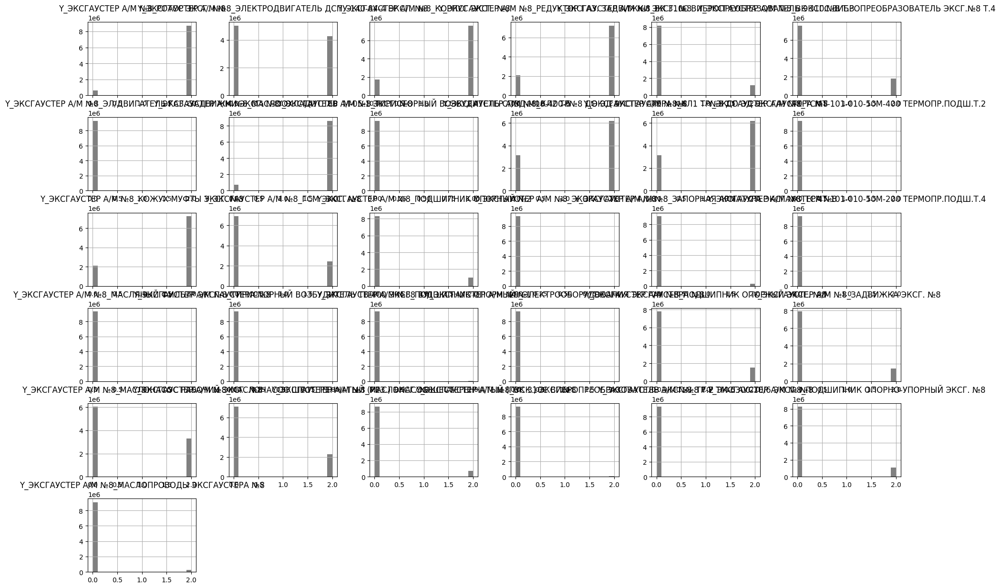

In [16]:
targets.hist(figsize=(22, 15),
              color='grey',
              bins=20);

In [17]:
%%time
correlations_pearson_targets = targets.corr()

CPU times: total: 11.1 s
Wall time: 14.6 s


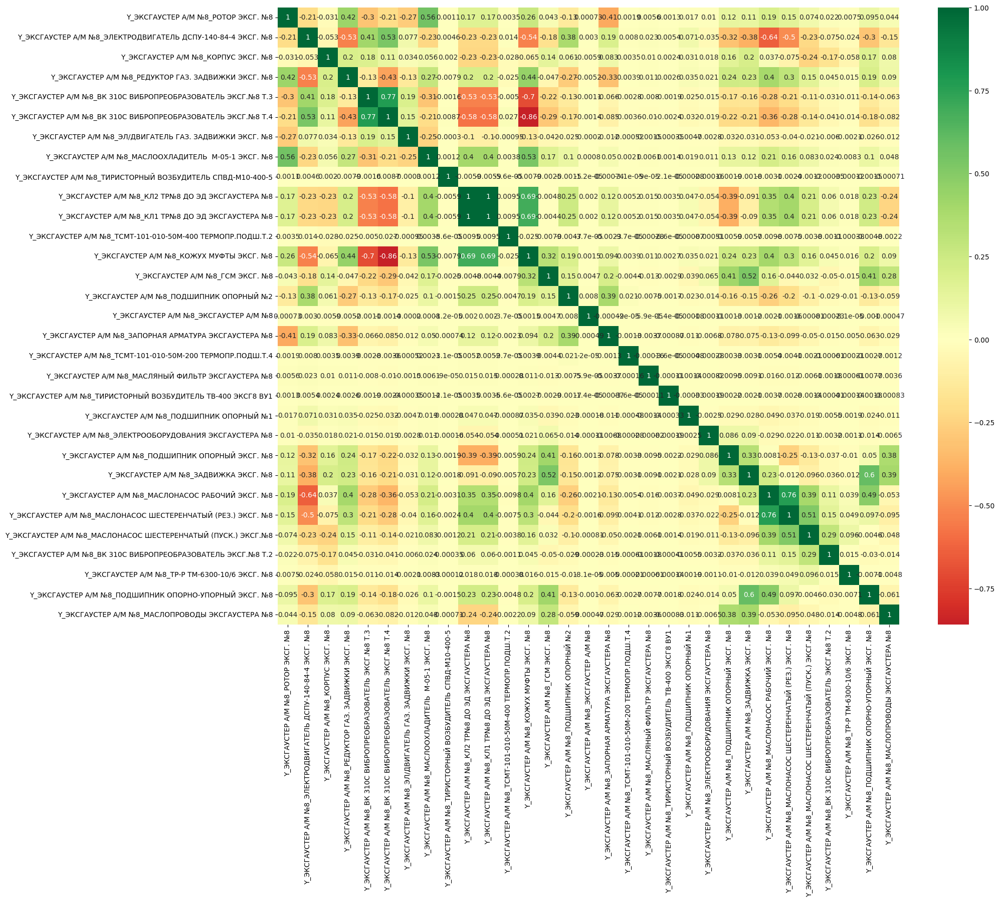

In [18]:
plt.figure(figsize=(20, 16))
sns.heatmap(correlations_pearson_targets,
            cmap='RdYlGn',
            center=0,
            annot=True);

In [19]:
upper_targets = correlations_pearson_targets.where(np.triu(np.ones(correlations_pearson_targets.shape), k=1).astype(np.bool_))
high_corr_targets = upper_targets.stack()[abs(upper_targets.stack()) > 0.8]

In [20]:
correlated_targets = set()
for idx in high_corr_targets.index:
    correlated_targets.add(idx[1])
correlated_targets

{'Y_ЭКСГАУСТЕР А/М №8_КЛ1 ТР№8 ДО ЭД ЭКСГАУСТЕРА №8',
 'Y_ЭКСГАУСТЕР А/М №8_КОЖУХ МУФТЫ ЭКСГ. №8'}

In [21]:
pd.DataFrame(round(targets.isna().mean()*100,6)).style.background_gradient('coolwarm')

,0
Y_ЭКСГАУСТЕР А/М №8_РОТОР ЭКСГ. №8,0.000000
Y_ЭКСГАУСТЕР А/М №8_ЭЛЕКТРОДВИГАТЕЛЬ ДСПУ-140-84-4 ЭКСГ. №8,0.000000
Y_ЭКСГАУСТЕР А/М №8_КОРПУС ЭКСГ. №8,0.000000
Y_ЭКСГАУСТЕР А/М №8_РЕДУКТОР ГАЗ. ЗАДВИЖКИ ЭКСГ. №8,0.000000
Y_ЭКСГАУСТЕР А/М №8_ВК 310С ВИБРОПРЕОБРАЗОВАТЕЛЬ ЭКСГ.№8 Т.3,0.000000
Y_ЭКСГАУСТЕР А/М №8_ВК 310С ВИБРОПРЕОБРАЗОВАТЕЛЬ ЭКСГ.№8 Т.4,0.000000
Y_ЭКСГАУСТЕР А/М №8_ЭЛ/ДВИГАТЕЛЬ ГАЗ. ЗАДВИЖКИ ЭКСГ. №8,0.000000
Y_ЭКСГАУСТЕР А/М №8_МАСЛООХЛАДИТЕЛЬ М-05-1 ЭКСГ. №8,0.000000
Y_ЭКСГАУСТЕР А/М №8_ТИРИСТОРНЫЙ ВОЗБУДИТЕЛЬ СПВД-М10-400-5,0.000000
Y_ЭКСГАУСТЕР А/М №8_КЛ2 ТР№8 ДО ЭД ЭКСГАУСТЕРА №8,0.000000


### Combined analysis

In [22]:
features_list = features.columns
targets_list = targets.columns

In [23]:
df = pd.concat([features, targets], axis=1)

In [24]:
phik_corr = df.phik_matrix()

interval columns not set, guessing: ['ЭКСГАУСТЕР 8. ТОК РОТОРА 1', 'ЭКСГАУСТЕР 8. ТОК РОТОРА 2', 'ЭКСГАУСТЕР 8. ТОК СТАТОРА', 'ЭКСГАУСТЕР 8. ДАВЛЕНИЕ МАСЛА В СИСТЕМЕ', 'ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА ПОДШИПНИКА НА ОПОРЕ 1', 'ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА ПОДШИПНИКА НА ОПОРЕ 2', 'ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА ПОДШИПНИКА НА ОПОРЕ 3', 'ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА ПОДШИПНИКА НА ОПОРЕ 4', 'ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА МАСЛА В СИСТЕМЕ', 'ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА МАСЛА В МАСЛОБЛОКЕ', 'ЭКСГАУСТЕР 8. ВИБРАЦИЯ НА ОПОРЕ 1', 'ЭКСГАУСТЕР 8. ВИБРАЦИЯ НА ОПОРЕ 2', 'ЭКСГАУСТЕР 8. ВИБРАЦИЯ НА ОПОРЕ 3', 'ЭКСГАУСТЕР 8. ВИБРАЦИЯ НА ОПОРЕ 3. ПРОДОЛЬНАЯ.', 'ЭКСГАУСТЕР 8. ВИБРАЦИЯ НА ОПОРЕ 4', 'ЭКСГАУСТЕР 8. ВИБРАЦИЯ НА ОПОРЕ 4. ПРОДОЛЬНАЯ.', 'Y_ЭКСГАУСТЕР А/М №8_РОТОР ЭКСГ. №8', 'Y_ЭКСГАУСТЕР А/М №8_ЭЛЕКТРОДВИГАТЕЛЬ ДСПУ-140-84-4 ЭКСГ. №8', 'Y_ЭКСГАУСТЕР А/М №8_КОРПУС ЭКСГ. №8', 'Y_ЭКСГАУСТЕР А/М №8_РЕДУКТОР ГАЗ. ЗАДВИЖКИ ЭКСГ. №8', 'Y_ЭКСГАУСТЕР А/М №8_ВК 310С ВИБРОПРЕОБРАЗОВАТЕЛЬ ЭКСГ.№8 Т.3', 'Y_ЭКСГАУСТЕР А/М №8_ВК 310С

In [31]:
phik_corr.loc[features_list, targets_list]

,Y_ЭКСГАУСТЕР А/М №8_РОТОР ЭКСГ. №8,Y_ЭКСГАУСТЕР А/М №8_ЭЛЕКТРОДВИГАТЕЛЬ ДСПУ-140-84-4 ЭКСГ. №8,Y_ЭКСГАУСТЕР А/М №8_КОРПУС ЭКСГ. №8,Y_ЭКСГАУСТЕР А/М №8_РЕДУКТОР ГАЗ. ЗАДВИЖКИ ЭКСГ. №8,Y_ЭКСГАУСТЕР А/М №8_ВК 310С ВИБРОПРЕОБРАЗОВАТЕЛЬ ЭКСГ.№8 Т.3,Y_ЭКСГАУСТЕР А/М №8_ВК 310С ВИБРОПРЕОБРАЗОВАТЕЛЬ ЭКСГ.№8 Т.4,Y_ЭКСГАУСТЕР А/М №8_ЭЛ/ДВИГАТЕЛЬ ГАЗ. ЗАДВИЖКИ ЭКСГ. №8,Y_ЭКСГАУСТЕР А/М №8_МАСЛООХЛАДИТЕЛЬ М-05-1 ЭКСГ. №8,Y_ЭКСГАУСТЕР А/М №8_ТИРИСТОРНЫЙ ВОЗБУДИТЕЛЬ СПВД-М10-400-5,Y_ЭКСГАУСТЕР А/М №8_КЛ2 ТР№8 ДО ЭД ЭКСГАУСТЕРА №8,...,Y_ЭКСГАУСТЕР А/М №8_ЭЛЕКТРООБОРУДОВАНИЯ ЭКСГАУСТЕРА №8,Y_ЭКСГАУСТЕР А/М №8_ПОДШИПНИК ОПОРНЫЙ ЭКСГ. №8,Y_ЭКСГАУСТЕР А/М №8_ЗАДВИЖКА ЭКСГ. №8,Y_ЭКСГАУСТЕР А/М №8_МАСЛОНАСОС РАБОЧИЙ ЭКСГ. №8,Y_ЭКСГАУСТЕР А/М №8_МАСЛОНАСОС ШЕСТЕРЕНЧАТЫЙ (РЕЗ.) ЭКСГ. №8,Y_ЭКСГАУСТЕР А/М №8_МАСЛОНАСОС ШЕСТЕРЕНЧАТЫЙ (ПУСК.) ЭКСГ.№8,Y_ЭКСГАУСТЕР А/М №8_ВК 310С ВИБРОПРЕОБРАЗОВАТЕЛЬ ЭКСГ.№8 Т.2,Y_ЭКСГАУСТЕР А/М №8_ТР-Р ТМ-6300-10/6 ЭКСГ. №8,Y_ЭКСГАУСТЕР А/М №8_ПОДШИПНИК ОПОРНО-УПОРНЫЙ ЭКСГ. №8,Y_ЭКСГАУСТЕР А/М №8_МАСЛОПРОВОДЫ ЭКСГАУСТЕРА №8
ЭКСГАУСТЕР 8. ТОК РОТОРА 1,0.323111,0.650355,0.211488,0.641185,0.421745,0.480548,0.104110,0.305747,0.005947,0.278247,...,0.036373,0.495030,0.518110,0.934438,0.826416,0.469136,0.121159,0.038165,0.465981,0.214997
ЭКСГАУСТЕР 8. ТОК РОТОРА 2,0.322549,0.649906,0.212913,0.637774,0.423339,0.481872,0.104422,0.304711,0.005936,0.278754,...,0.036330,0.494492,0.517727,0.934310,0.826110,0.468773,0.121059,0.038131,0.465613,0.214817
ЭКСГАУСТЕР 8. ТОК СТАТОРА,0.020261,0.004979,0.001355,0.001497,0.001182,0.001503,0.000807,0.001446,0.021799,0.000559,...,0.029578,0.001496,0.001914,0.002885,0.002370,0.001643,0.000657,0.009129,0.001466,0.000000
ЭКСГАУСТЕР 8. ДАВЛЕНИЕ МАСЛА В СИСТЕМЕ,0.241236,0.348506,0.081099,0.124229,0.046674,0.120913,0.038442,0.052432,0.001826,0.177405,...,0.041212,0.213786,0.133545,0.211332,0.160061,0.132385,0.053421,0.005065,0.254699,0.108858
ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА ПОДШИПНИКА НА ОПОРЕ 1,0.070015,0.164204,0.022544,0.022322,0.014219,0.018383,0.006201,0.010473,0.000624,0.016472,...,0.015580,0.061827,0.027336,0.057513,0.062261,0.087550,0.019434,0.414068,0.009273,0.027232
ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА ПОДШИПНИКА НА ОПОРЕ 2,0.005700,0.007396,0.019434,0.026685,0.083681,0.057960,0.005367,0.000958,0.000000,0.035691,...,0.001910,0.024220,0.004496,0.024024,0.024415,0.071939,0.004520,0.001210,0.005872,0.009929
ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА ПОДШИПНИКА НА ОПОРЕ 3,0.183763,0.283355,0.104457,0.242120,0.191887,0.261349,0.052645,0.111761,0.004958,0.228028,...,0.041049,0.411592,0.152292,0.151295,0.168186,0.227218,0.147675,0.892745,0.171478,0.357902
ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА ПОДШИПНИКА НА ОПОРЕ 4,0.099677,0.004344,0.000716,0.001566,0.000870,0.001408,0.000000,0.000000,0.000000,0.002162,...,0.000000,0.000278,0.000702,0.001733,0.001188,0.000000,0.000000,0.000000,0.000028,0.000000
ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА МАСЛА В СИСТЕМЕ,0.039391,0.069962,0.078735,0.105617,0.056838,0.089763,0.004883,0.035808,0.001576,0.178809,...,0.007956,0.392773,0.293259,0.121910,0.152040,0.202028,0.051275,0.738497,0.049331,0.441073
ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА МАСЛА В МАСЛОБЛОКЕ,0.242852,0.327405,0.135666,0.375362,0.296363,0.404256,0.077831,0.210446,0.003804,0.371847,...,0.044978,0.408076,0.200431,0.365627,0.320422,0.329197,0.115921,0.951665,0.283355,0.379101


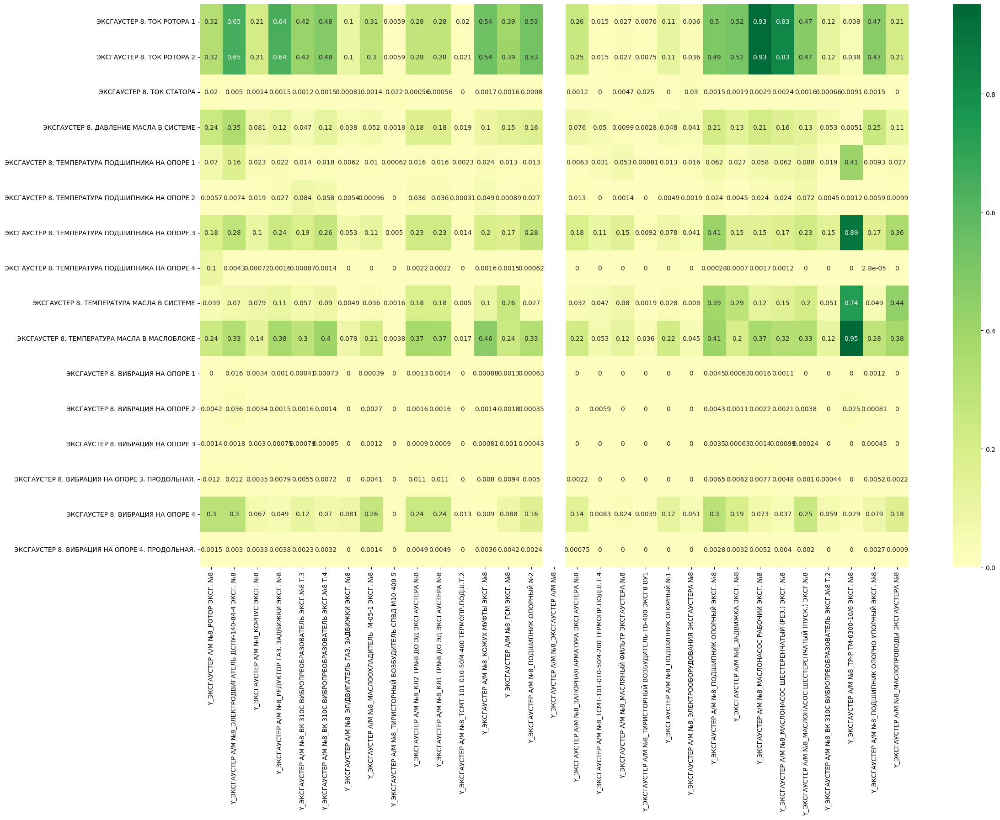

In [35]:
plt.figure(figsize=(25, 16))
sns.heatmap(phik_corr.loc[features_list, targets_list],
            cmap='RdYlGn',
            center=0,
            annot=True);

In [39]:
row_avg = phik_corr.loc[features_list, targets_list].T.mean()
row_avg

ЭКСГАУСТЕР 8. ТОК РОТОРА 1                         0.324174
ЭКСГАУСТЕР 8. ТОК РОТОРА 2                         0.323812
ЭКСГАУСТЕР 8. ТОК СТАТОРА                          0.004741
ЭКСГАУСТЕР 8. ДАВЛЕНИЕ МАСЛА В СИСТЕМЕ             0.111285
ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА ПОДШИПНИКА НА ОПОРЕ 1    0.043301
ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА ПОДШИПНИКА НА ОПОРЕ 2    0.018242
ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА ПОДШИПНИКА НА ОПОРЕ 3    0.193562
ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА ПОДШИПНИКА НА ОПОРЕ 4    0.004018
ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА МАСЛА В СИСТЕМЕ          0.129290
ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА МАСЛА В МАСЛОБЛОКЕ       0.263717
ЭКСГАУСТЕР 8. ВИБРАЦИЯ НА ОПОРЕ 1                  0.001215
ЭКСГАУСТЕР 8. ВИБРАЦИЯ НА ОПОРЕ 2                  0.003424
ЭКСГАУСТЕР 8. ВИБРАЦИЯ НА ОПОРЕ 3                  0.000704
ЭКСГАУСТЕР 8. ВИБРАЦИЯ НА ОПОРЕ 3. ПРОДОЛЬНАЯ.     0.004382
ЭКСГАУСТЕР 8. ВИБРАЦИЯ НА ОПОРЕ 4                  0.118232
ЭКСГАУСТЕР 8. ВИБРАЦИЯ НА ОПОРЕ 4. ПРОДОЛЬНАЯ.     0.001997
dtype: float64

In [44]:
selected_features = row_avg[row_avg > 0.1].index
selected_features.shape

(7,)

In [45]:
features_short = selected_features
features_short

Index(['ЭКСГАУСТЕР 8. ТОК РОТОРА 1', 'ЭКСГАУСТЕР 8. ТОК РОТОРА 2',
       'ЭКСГАУСТЕР 8. ДАВЛЕНИЕ МАСЛА В СИСТЕМЕ',
       'ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА ПОДШИПНИКА НА ОПОРЕ 3',
       'ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА МАСЛА В СИСТЕМЕ',
       'ЭКСГАУСТЕР 8. ТЕМПЕРАТУРА МАСЛА В МАСЛОБЛОКЕ',
       'ЭКСГАУСТЕР 8. ВИБРАЦИЯ НА ОПОРЕ 4'],
      dtype='object')

In [61]:
X = features[features_short]
X.shape

(9335034, 7)

In [50]:
targets.shape

(9335034, 31)

In [75]:
params = {'learning_rate' : [0.01, 0.05, 0.1, 0.2]}

In [84]:
models = {}
cv = {}
for target in tqdm(targets_list):
    y = targets[target]
    cbc = CatBoostClassifier(task_type='GPU',
                             random_seed=SEED,
                             iterations=1000,
                             verbose=500)
    cbc_rs=cbc.randomized_search(params,
                          X=X,
                          y=y,
                          n_iter = 4,
                          cv = 3,
                          verbose=3,
                          )
    models[target] = cbc
    cv[target] = cbc_rs

  0%|                                                                                                      | 0/31 [00:00<?, ?it/s]

0:	learn: 1.0801741	test: 1.0802770	best: 1.0802770 (0)	total: 31.3ms	remaining: 31.2s
500:	learn: 0.0548830	test: 0.0547654	best: 0.0547654 (500)	total: 9.54s	remaining: 9.5s
999:	learn: 0.0301355	test: 0.0300945	best: 0.0300945 (999)	total: 18.4s	remaining: 0us
bestTest = 0.03009445524
bestIteration = 999
0:	loss: 0.0300945	best: 0.0300945 (0)	total: 19.9s	remaining: 59.8s
0:	learn: 1.0087872	test: 1.0088053	best: 1.0088053 (0)	total: 19.8ms	remaining: 19.8s
500:	learn: 0.0136235	test: 0.0136857	best: 0.0136857 (500)	total: 8.96s	remaining: 8.92s
999:	learn: 0.0077986	test: 0.0079156	best: 0.0079156 (999)	total: 17.8s	remaining: 0us
bestTest = 0.007915600971
bestIteration = 999
0:	learn: 0.9237768	test: 0.9238089	best: 0.9238089 (0)	total: 19.5ms	remaining: 19.5s
500:	learn: 0.0077736	test: 0.0078548	best: 0.0078548 (500)	total: 8.91s	remaining: 8.88s
999:	learn: 0.0046805	test: 0.0048413	best: 0.0048413 (999)	total: 17.7s	remaining: 0us
bestTest = 0.004841298027
bestIteration = 999


  3%|██▉                                                                                        | 1/31 [02:30<1:15:26, 150.88s/it]

0:	learn: 1.0818396	test: 1.0817190	best: 1.0817190 (0)	total: 20.4ms	remaining: 20.4s
500:	learn: 0.1060148	test: 0.1060441	best: 0.1060441 (500)	total: 8.97s	remaining: 8.93s
999:	learn: 0.0679374	test: 0.0678715	best: 0.0678715 (999)	total: 17.7s	remaining: 0us
bestTest = 0.06787154437
bestIteration = 999
0:	loss: 0.0678715	best: 0.0678715 (0)	total: 19.3s	remaining: 58s
0:	learn: 1.0158748	test: 1.0158738	best: 1.0158738 (0)	total: 20.2ms	remaining: 20.2s
500:	learn: 0.0344828	test: 0.0343851	best: 0.0343851 (500)	total: 8.84s	remaining: 8.8s
999:	learn: 0.0205620	test: 0.0204832	best: 0.0204832 (999)	total: 17.6s	remaining: 0us
bestTest = 0.02048323952
bestIteration = 999
0:	learn: 0.9375610	test: 0.9375547	best: 0.9375547 (0)	total: 20.6ms	remaining: 20.6s
500:	learn: 0.0203120	test: 0.0202304	best: 0.0202304 (500)	total: 8.82s	remaining: 8.79s
999:	learn: 0.0128573	test: 0.0128887	best: 0.0128887 (999)	total: 17.5s	remaining: 0us
bestTest = 0.01288868213
bestIteration = 999
0:	l

  6%|█████▊                                                                                     | 2/31 [05:01<1:12:47, 150.59s/it]

0:	learn: 0.6836755	test: 0.6836814	best: 0.6836814 (0)	total: 232ms	remaining: 3m 51s
500:	learn: 0.1867865	test: 0.1868094	best: 0.1868094 (500)	total: 1m 3s	remaining: 1m 3s
999:	learn: 0.1298298	test: 0.1299208	best: 0.1299208 (999)	total: 2m 6s	remaining: 0us
bestTest = 0.1299207853
bestIteration = 999
0:	loss: 0.1299208	best: 0.1299208 (0)	total: 2m 8s	remaining: 6m 25s
0:	learn: 0.6474886	test: 0.6475150	best: 0.6475150 (0)	total: 125ms	remaining: 2m 4s
500:	learn: 0.0691085	test: 0.0693005	best: 0.0693005 (500)	total: 1m 3s	remaining: 1m 3s
999:	learn: 0.0408657	test: 0.0410942	best: 0.0410942 (999)	total: 2m 6s	remaining: 0us
bestTest = 0.04109419013
bestIteration = 999
0:	learn: 0.6060480	test: 0.6060922	best: 0.6060922 (0)	total: 125ms	remaining: 2m 4s
500:	learn: 0.0400130	test: 0.0402806	best: 0.0402806 (500)	total: 1m 3s	remaining: 1m 2s
999:	learn: 0.0244434	test: 0.0247755	best: 0.0247755 (999)	total: 2m 5s	remaining: 0us
bestTest = 0.02477550382
bestIteration = 999
0:	

 10%|████████▊                                                                                  | 3/31 [18:50<3:34:55, 460.57s/it]

0:	learn: 0.6654039	test: 0.6653815	best: 0.6653815 (0)	total: 152ms	remaining: 2m 31s
500:	learn: 0.0995675	test: 0.0993911	best: 0.0993911 (500)	total: 1m 2s	remaining: 1m 2s
999:	learn: 0.0617484	test: 0.0617297	best: 0.0617297 (999)	total: 2m 5s	remaining: 0us
bestTest = 0.06172968704
bestIteration = 999
0:	loss: 0.0617297	best: 0.0617297 (0)	total: 2m 7s	remaining: 6m 22s
0:	learn: 0.5673643	test: 0.5672688	best: 0.5672688 (0)	total: 124ms	remaining: 2m 3s
500:	learn: 0.0270666	test: 0.0270619	best: 0.0270619 (500)	total: 1m 2s	remaining: 1m 2s
999:	learn: 0.0139566	test: 0.0139784	best: 0.0139784 (999)	total: 2m 5s	remaining: 0us
bestTest = 0.01397840359
bestIteration = 999
0:	learn: 0.4721126	test: 0.4719512	best: 0.4719512 (0)	total: 122ms	remaining: 2m 1s
500:	learn: 0.0136304	test: 0.0136807	best: 0.0136807 (500)	total: 1m 2s	remaining: 1m 2s
999:	learn: 0.0080136	test: 0.0081242	best: 0.0081242 (999)	total: 2m 4s	remaining: 0us
bestTest = 0.008124153035
bestIteration = 999
0

 13%|███████████▋                                                                               | 4/31 [32:06<4:26:51, 593.00s/it]

0:	learn: 0.6665270	test: 0.6665158	best: 0.6665158 (0)	total: 161ms	remaining: 2m 40s
500:	learn: 0.0742667	test: 0.0741990	best: 0.0741990 (500)	total: 1m 2s	remaining: 1m 2s
999:	learn: 0.0398418	test: 0.0397806	best: 0.0397806 (999)	total: 2m 5s	remaining: 0us
bestTest = 0.0397805736
bestIteration = 999
0:	loss: 0.0397806	best: 0.0397806 (0)	total: 2m 6s	remaining: 6m 20s
0:	learn: 0.5711993	test: 0.5711523	best: 0.5711523 (0)	total: 122ms	remaining: 2m 1s
500:	learn: 0.0167194	test: 0.0167504	best: 0.0167504 (500)	total: 1m 2s	remaining: 1m 2s
999:	learn: 0.0084781	test: 0.0085100	best: 0.0085100 (999)	total: 2m 4s	remaining: 0us
bestTest = 0.008510000481
bestIteration = 999
0:	learn: 0.4757295	test: 0.4756583	best: 0.4756583 (0)	total: 122ms	remaining: 2m 1s
500:	learn: 0.0083913	test: 0.0084532	best: 0.0084532 (500)	total: 1m 2s	remaining: 1m 2s
999:	learn: 0.0052118	test: 0.0053152	best: 0.0053152 (999)	total: 2m 3s	remaining: 0us
bestTest = 0.005315227732
bestIteration = 999
0

 16%|██████████████▋                                                                            | 5/31 [45:39<4:51:18, 672.26s/it]

0:	learn: 0.6701027	test: 0.6700936	best: 0.6700936 (0)	total: 225ms	remaining: 3m 44s
500:	learn: 0.0572961	test: 0.0570640	best: 0.0570640 (500)	total: 1m 2s	remaining: 1m 2s
999:	learn: 0.0321854	test: 0.0320008	best: 0.0320008 (999)	total: 2m 5s	remaining: 0us
bestTest = 0.03200080898
bestIteration = 999
0:	loss: 0.0320008	best: 0.0320008 (0)	total: 2m 7s	remaining: 6m 21s
0:	learn: 0.5860046	test: 0.5859672	best: 0.5859672 (0)	total: 122ms	remaining: 2m 2s
500:	learn: 0.0123776	test: 0.0122621	best: 0.0122621 (500)	total: 1m 2s	remaining: 1m 2s
999:	learn: 0.0066640	test: 0.0065928	best: 0.0065928 (999)	total: 2m 4s	remaining: 0us
bestTest = 0.006592776965
bestIteration = 999
0:	learn: 0.4983091	test: 0.4982401	best: 0.4982401 (0)	total: 123ms	remaining: 2m 2s
500:	learn: 0.0065804	test: 0.0065282	best: 0.0065282 (500)	total: 1m 3s	remaining: 1m 3s
999:	learn: 0.0042969	test: 0.0042956	best: 0.0042956 (999)	total: 2m 4s	remaining: 0us
bestTest = 0.004295579216
bestIteration = 999


 19%|█████████████████▌                                                                         | 6/31 [59:09<4:59:38, 719.14s/it]

0:	learn: 0.6448310	test: 0.6448254	best: 0.6448254 (0)	total: 254ms	remaining: 4m 13s
500:	learn: 0.0015890	test: 0.0016006	best: 0.0016006 (500)	total: 1m 3s	remaining: 1m 3s
999:	learn: 0.0008044	test: 0.0008344	best: 0.0008344 (999)	total: 2m 7s	remaining: 0us
bestTest = 0.0008343938795
bestIteration = 999
0:	loss: 0.0008344	best: 0.0008344 (0)	total: 2m 9s	remaining: 6m 27s
0:	learn: 0.4766742	test: 0.4766601	best: 0.4766601 (0)	total: 126ms	remaining: 2m 5s
500:	learn: 0.0004561	test: 0.0004869	best: 0.0004869 (500)	total: 1m 3s	remaining: 1m 3s
999:	learn: 0.0003580	test: 0.0004015	best: 0.0004015 (998)	total: 2m 7s	remaining: 0us
bestTest = 0.0004014784681
bestIteration = 998
0:	learn: 0.3191229	test: 0.3190993	best: 0.3190993 (0)	total: 125ms	remaining: 2m 4s
500:	learn: 0.0003500	test: 0.0004035	best: 0.0004035 (500)	total: 1m 3s	remaining: 1m 3s
999:	learn: 0.0002888	test: 0.0003625	best: 0.0003625 (998)	total: 2m 7s	remaining: 0us
bestTest = 0.0003624937241
bestIteration = 

 23%|████████████████████                                                                     | 7/31 [1:13:05<5:02:52, 757.18s/it]

0:	learn: 0.6674185	test: 0.6674129	best: 0.6674129 (0)	total: 261ms	remaining: 4m 20s
500:	learn: 0.0306778	test: 0.0305950	best: 0.0305950 (500)	total: 1m 4s	remaining: 1m 4s
999:	learn: 0.0153814	test: 0.0153495	best: 0.0153495 (999)	total: 2m 8s	remaining: 0us
bestTest = 0.01534954869
bestIteration = 999
0:	loss: 0.0153495	best: 0.0153495 (0)	total: 2m 10s	remaining: 6m 31s
0:	learn: 0.5740465	test: 0.5740315	best: 0.5740315 (0)	total: 129ms	remaining: 2m 8s
500:	learn: 0.0058557	test: 0.0058480	best: 0.0058480 (500)	total: 1m 4s	remaining: 1m 3s
999:	learn: 0.0032822	test: 0.0033115	best: 0.0033115 (999)	total: 2m 8s	remaining: 0us
bestTest = 0.003311512329
bestIteration = 999
0:	learn: 0.4777361	test: 0.4777298	best: 0.4777298 (0)	total: 128ms	remaining: 2m 8s
500:	learn: 0.0033239	test: 0.0033495	best: 0.0033495 (500)	total: 1m 4s	remaining: 1m 3s
999:	learn: 0.0022634	test: 0.0023264	best: 0.0023264 (999)	total: 2m 5s	remaining: 0us
bestTest = 0.002326390686
bestIteration = 999

 26%|██████████████████████▉                                                                  | 8/31 [1:26:45<4:57:57, 777.30s/it]

0:	learn: 0.6414880	test: 0.6414781	best: 0.6414781 (0)	total: 173ms	remaining: 2m 52s
500:	learn: 0.0000634	test: 0.0000696	best: 0.0000696 (500)	total: 1m 2s	remaining: 1m 2s
999:	learn: 0.0000572	test: 0.0000655	best: 0.0000655 (999)	total: 2m 4s	remaining: 0us
bestTest = 6.553576293e-05
bestIteration = 999
0:	loss: 0.0000655	best: 0.0000655 (0)	total: 2m 6s	remaining: 6m 18s
0:	learn: 0.4629647	test: 0.4629626	best: 0.4629626 (0)	total: 93.8ms	remaining: 1m 33s
500:	learn: 0.0000086	test: 0.0000258	best: 0.0000257 (484)	total: 1m 1s	remaining: 1m 1s
999:	learn: 0.0000044	test: 0.0000237	best: 0.0000236 (948)	total: 2m 4s	remaining: 0us
bestTest = 2.364702763e-05
bestIteration = 948
0:	learn: 0.2958631	test: 0.2958813	best: 0.2958813 (0)	total: 92.9ms	remaining: 1m 32s
500:	learn: 0.0000319	test: 0.0000419	best: 0.0000419 (500)	total: 1m 3s	remaining: 1m 2s
999:	learn: 0.0000138	test: 0.0000278	best: 0.0000278 (999)	total: 2m 6s	remaining: 0us
bestTest = 2.782433227e-05
bestIteratio

 29%|█████████████████████████▊                                                               | 9/31 [1:40:35<4:51:00, 793.68s/it]

0:	learn: 0.6748290	test: 0.6748152	best: 0.6748152 (0)	total: 237ms	remaining: 3m 57s
500:	learn: 0.0649306	test: 0.0647865	best: 0.0647865 (500)	total: 1m 3s	remaining: 1m 3s
999:	learn: 0.0366474	test: 0.0365503	best: 0.0365503 (999)	total: 2m 6s	remaining: 0us
bestTest = 0.03655032828
bestIteration = 999
0:	loss: 0.0365503	best: 0.0365503 (0)	total: 2m 8s	remaining: 6m 25s
0:	learn: 0.6070678	test: 0.6070107	best: 0.6070107 (0)	total: 127ms	remaining: 2m 6s
500:	learn: 0.0153285	test: 0.0153549	best: 0.0153549 (500)	total: 1m 2s	remaining: 1m 2s
999:	learn: 0.0082462	test: 0.0083005	best: 0.0083005 (999)	total: 2m 5s	remaining: 0us
bestTest = 0.008300529918
bestIteration = 999
0:	learn: 0.5343499	test: 0.5342464	best: 0.5342464 (0)	total: 126ms	remaining: 2m 5s
500:	learn: 0.0081315	test: 0.0081822	best: 0.0081822 (500)	total: 1m 2s	remaining: 1m 2s
999:	learn: 0.0061696	test: 0.0062478	best: 0.0062478 (805)	total: 1m 52s	remaining: 0us
bestTest = 0.006247794871
bestIteration = 805

 32%|████████████████████████████▍                                                           | 10/31 [1:53:24<4:35:11, 786.24s/it]

0:	learn: 0.6748310	test: 0.6748171	best: 0.6748171 (0)	total: 238ms	remaining: 3m 57s
500:	learn: 0.0655997	test: 0.0654115	best: 0.0654115 (500)	total: 1m 3s	remaining: 1m 3s
999:	learn: 0.0373744	test: 0.0372426	best: 0.0372426 (999)	total: 2m 6s	remaining: 0us
bestTest = 0.03724259604
bestIteration = 999
0:	loss: 0.0372426	best: 0.0372426 (0)	total: 2m 8s	remaining: 6m 24s
0:	learn: 0.6070780	test: 0.6070212	best: 0.6070212 (0)	total: 126ms	remaining: 2m 5s
500:	learn: 0.0158435	test: 0.0158511	best: 0.0158511 (500)	total: 1m 3s	remaining: 1m 2s
999:	learn: 0.0085022	test: 0.0085455	best: 0.0085455 (999)	total: 2m 5s	remaining: 0us
bestTest = 0.008545542097
bestIteration = 999
0:	learn: 0.5343703	test: 0.5342671	best: 0.5342671 (0)	total: 123ms	remaining: 2m 3s
500:	learn: 0.0085524	test: 0.0086150	best: 0.0086150 (500)	total: 1m 2s	remaining: 1m 2s
999:	learn: 0.0055462	test: 0.0056431	best: 0.0056431 (998)	total: 1m 57s	remaining: 0us
bestTest = 0.005643068002
bestIteration = 998

 35%|███████████████████████████████▏                                                        | 11/31 [2:06:12<4:20:11, 780.55s/it]

0:	learn: 0.6400473	test: 0.6400334	best: 0.6400334 (0)	total: 123ms	remaining: 2m 2s
500:	learn: 0.0002020	test: 0.0001981	best: 0.0001981 (500)	total: 1m 2s	remaining: 1m 2s
999:	learn: 0.0001491	test: 0.0001595	best: 0.0001595 (999)	total: 2m 4s	remaining: 0us
bestTest = 0.0001594558238
bestIteration = 999
0:	loss: 0.0001595	best: 0.0001595 (0)	total: 2m 6s	remaining: 6m 19s
0:	learn: 0.4570475	test: 0.4570321	best: 0.4570321 (0)	total: 123ms	remaining: 2m 3s
500:	learn: 0.0001209	test: 0.0001459	best: 0.0001459 (500)	total: 1m 2s	remaining: 1m 2s
999:	learn: 0.0001044	test: 0.0001380	best: 0.0001379 (952)	total: 2m 5s	remaining: 0us
bestTest = 0.0001379247479
bestIteration = 952
0:	learn: 0.2896796	test: 0.2896540	best: 0.2896540 (0)	total: 123ms	remaining: 2m 2s
500:	learn: 0.0001052	test: 0.0001375	best: 0.0001373 (490)	total: 1m 2s	remaining: 1m 2s
999:	learn: 0.0000913	test: 0.0001368	best: 0.0001365 (951)	total: 2m 5s	remaining: 0us
bestTest = 0.0001365295342
bestIteration = 9

 39%|██████████████████████████████████                                                      | 12/31 [2:19:58<4:11:31, 794.28s/it]

0:	learn: 0.6677380	test: 0.6677160	best: 0.6677160 (0)	total: 239ms	remaining: 3m 58s
500:	learn: 0.0405664	test: 0.0405008	best: 0.0405008 (500)	total: 1m 2s	remaining: 1m 2s
999:	learn: 0.0203741	test: 0.0203384	best: 0.0203384 (999)	total: 2m 5s	remaining: 0us
bestTest = 0.02033841171
bestIteration = 999
0:	loss: 0.0203384	best: 0.0203384 (0)	total: 2m 6s	remaining: 6m 20s
0:	learn: 0.5749659	test: 0.5748716	best: 0.5748716 (0)	total: 126ms	remaining: 2m 5s
500:	learn: 0.0087055	test: 0.0087524	best: 0.0087524 (500)	total: 1m 2s	remaining: 1m 2s
999:	learn: 0.0049616	test: 0.0050181	best: 0.0050181 (999)	total: 2m 4s	remaining: 0us
bestTest = 0.00501807976
bestIteration = 999
0:	learn: 0.4782055	test: 0.4780385	best: 0.4780385 (0)	total: 125ms	remaining: 2m 4s
500:	learn: 0.0047451	test: 0.0048017	best: 0.0048017 (500)	total: 1m 2s	remaining: 1m 2s
999:	learn: 0.0033662	test: 0.0034374	best: 0.0034374 (999)	total: 2m 1s	remaining: 0us
bestTest = 0.003437372561
bestIteration = 999
0

 42%|████████████████████████████████████▉                                                   | 13/31 [2:33:13<3:58:24, 794.70s/it]

0:	learn: 0.6839183	test: 0.6839150	best: 0.6839150 (0)	total: 210ms	remaining: 3m 29s
500:	learn: 0.1295191	test: 0.1294125	best: 0.1294125 (500)	total: 1m 3s	remaining: 1m 2s
999:	learn: 0.0811382	test: 0.0811001	best: 0.0811001 (999)	total: 2m 6s	remaining: 0us
bestTest = 0.08110010769
bestIteration = 999
0:	loss: 0.0811001	best: 0.0811001 (0)	total: 2m 7s	remaining: 6m 23s
0:	learn: 0.6487120	test: 0.6486917	best: 0.6486917 (0)	total: 131ms	remaining: 2m 11s
500:	learn: 0.0391383	test: 0.0392100	best: 0.0392100 (500)	total: 1m 3s	remaining: 1m 2s
999:	learn: 0.0218591	test: 0.0219638	best: 0.0219638 (999)	total: 2m 5s	remaining: 0us
bestTest = 0.02196382407
bestIteration = 999
0:	learn: 0.6084998	test: 0.6084602	best: 0.6084602 (0)	total: 129ms	remaining: 2m 9s
500:	learn: 0.0213925	test: 0.0214862	best: 0.0214862 (500)	total: 1m 2s	remaining: 1m 2s
999:	learn: 0.0134818	test: 0.0136542	best: 0.0136542 (997)	total: 2m 4s	remaining: 0us
bestTest = 0.01365422685
bestIteration = 997
0

 45%|███████████████████████████████████████▋                                                | 14/31 [2:46:37<3:45:57, 797.48s/it]

0:	learn: 0.6653401	test: 0.6653357	best: 0.6653357 (0)	total: 125ms	remaining: 2m 4s
500:	learn: 0.0272724	test: 0.0272332	best: 0.0272332 (500)	total: 1m 2s	remaining: 1m 2s
999:	learn: 0.0154251	test: 0.0154168	best: 0.0154168 (999)	total: 2m 5s	remaining: 0us
bestTest = 0.0154167759
bestIteration = 999
0:	loss: 0.0154168	best: 0.0154168 (0)	total: 2m 7s	remaining: 6m 21s
0:	learn: 0.5651680	test: 0.5651499	best: 0.5651499 (0)	total: 121ms	remaining: 2m
500:	learn: 0.0076127	test: 0.0076669	best: 0.0076669 (500)	total: 1m 2s	remaining: 1m 2s
999:	learn: 0.0048311	test: 0.0049186	best: 0.0049186 (999)	total: 2m 5s	remaining: 0us
bestTest = 0.004918556541
bestIteration = 999
0:	learn: 0.4634185	test: 0.4633940	best: 0.4633940 (0)	total: 124ms	remaining: 2m 4s
500:	learn: 0.0047704	test: 0.0048626	best: 0.0048626 (500)	total: 1m 2s	remaining: 1m 2s
999:	learn: 0.0034878	test: 0.0035971	best: 0.0035971 (999)	total: 2m 4s	remaining: 0us
bestTest = 0.003597065561
bestIteration = 999
0:	le

 48%|██████████████████████████████████████████▌                                             | 15/31 [3:00:22<3:34:52, 805.76s/it]

0:	learn: 0.6400120	test: 0.6400003	best: 0.6400003 (0)	total: 146ms	remaining: 2m 25s
500:	learn: 0.0000649	test: 0.0000669	best: 0.0000669 (500)	total: 1m 4s	remaining: 1m 4s
999:	learn: 0.0000486	test: 0.0000499	best: 0.0000499 (999)	total: 2m 6s	remaining: 0us
bestTest = 4.989853771e-05
bestIteration = 999
0:	loss: 0.0000499	best: 0.0000499 (0)	total: 2m 8s	remaining: 6m 25s
0:	learn: 0.4570883	test: 0.4570909	best: 0.4570909 (0)	total: 88.4ms	remaining: 1m 28s
500:	learn: 0.0000450	test: 0.0000461	best: 0.0000461 (497)	total: 1m 1s	remaining: 1m 1s
999:	learn: 0.0000448	test: 0.0000459	best: 0.0000459 (997)	total: 2m 4s	remaining: 0us
bestTest = 4.588243458e-05
bestIteration = 997
0:	learn: 0.2893828	test: 0.2893834	best: 0.2893834 (0)	total: 90.5ms	remaining: 1m 30s
500:	learn: 0.0000450	test: 0.0000461	best: 0.0000461 (497)	total: 1m 3s	remaining: 1m 3s
999:	learn: 0.0000448	test: 0.0000460	best: 0.0000460 (817)	total: 2m 16s	remaining: 0us
bestTest = 4.595167506e-05
bestIterati

 52%|█████████████████████████████████████████████▍                                          | 16/31 [3:14:39<3:25:18, 821.25s/it]

0:	learn: 0.6575108	test: 0.6575178	best: 0.6575178 (0)	total: 229ms	remaining: 3m 48s
500:	learn: 0.0123296	test: 0.0123594	best: 0.0123594 (500)	total: 1m 3s	remaining: 1m 2s
999:	learn: 0.0068281	test: 0.0069343	best: 0.0069343 (999)	total: 2m 5s	remaining: 0us
bestTest = 0.006934318349
bestIteration = 999
0:	loss: 0.0069343	best: 0.0069343 (0)	total: 2m 7s	remaining: 6m 22s
0:	learn: 0.5302002	test: 0.5302327	best: 0.5302327 (0)	total: 125ms	remaining: 2m 5s
500:	learn: 0.0028040	test: 0.0028924	best: 0.0028924 (500)	total: 1m 2s	remaining: 1m 2s
999:	learn: 0.0014990	test: 0.0015701	best: 0.0015701 (999)	total: 2m 5s	remaining: 0us
bestTest = 0.001570145509
bestIteration = 999
0:	learn: 0.4034549	test: 0.4035039	best: 0.4035039 (0)	total: 125ms	remaining: 2m 4s
500:	learn: 0.0015350	test: 0.0015997	best: 0.0015997 (500)	total: 1m 2s	remaining: 1m 1s
999:	learn: 0.0010505	test: 0.0010937	best: 0.0010937 (999)	total: 2m 3s	remaining: 0us
bestTest = 0.001093695881
bestIteration = 999

 55%|████████████████████████████████████████████████▎                                       | 17/31 [3:28:25<3:11:57, 822.70s/it]

0:	learn: 0.6415625	test: 0.6415616	best: 0.6415616 (0)	total: 127ms	remaining: 2m 7s
500:	learn: 0.0001347	test: 0.0001343	best: 0.0001343 (496)	total: 1m 1s	remaining: 1m 1s
999:	learn: 0.0001310	test: 0.0001307	best: 0.0001307 (999)	total: 2m 3s	remaining: 0us
bestTest = 0.000130683838
bestIteration = 999
0:	loss: 0.0001307	best: 0.0001307 (0)	total: 2m 5s	remaining: 6m 16s
0:	learn: 0.4616293	test: 0.4616300	best: 0.4616300 (0)	total: 90.3ms	remaining: 1m 30s
500:	learn: 0.0001312	test: 0.0001282	best: 0.0001282 (500)	total: 1m 1s	remaining: 1m 1s
999:	learn: 0.0001304	test: 0.0001269	best: 0.0001269 (998)	total: 2m 3s	remaining: 0us
bestTest = 0.0001269230959
bestIteration = 998
0:	learn: 0.2951133	test: 0.2951064	best: 0.2951064 (0)	total: 91.1ms	remaining: 1m 31s
500:	learn: 0.0001276	test: 0.0001239	best: 0.0001239 (499)	total: 1m 2s	remaining: 1m 1s
999:	learn: 0.0001261	test: 0.0001223	best: 0.0001223 (968)	total: 2m 4s	remaining: 0us
bestTest = 0.0001223072683
bestIteration 

 58%|███████████████████████████████████████████████████                                     | 18/31 [3:41:55<2:57:22, 818.66s/it]

0:	learn: 0.6490051	test: 0.6490034	best: 0.6490034 (0)	total: 127ms	remaining: 2m 6s
500:	learn: 0.0000660	test: 0.0000686	best: 0.0000686 (500)	total: 1m 2s	remaining: 1m 1s
999:	learn: 0.0000352	test: 0.0000408	best: 0.0000408 (999)	total: 2m 1s	remaining: 0us
bestTest = 4.083616682e-05
bestIteration = 999
0:	loss: 0.0000408	best: 0.0000408 (0)	total: 2m 3s	remaining: 6m 9s
0:	learn: 0.4928787	test: 0.4928615	best: 0.4928615 (0)	total: 125ms	remaining: 2m 4s
500:	learn: 0.0000159	test: 0.0000273	best: 0.0000263 (411)	total: 59.4s	remaining: 59.2s
999:	learn: 0.0000120	test: 0.0000266	best: 0.0000263 (411)	total: 2m 1s	remaining: 0us
bestTest = 2.634355284e-05
bestIteration = 411
0:	learn: 0.3411955	test: 0.3411672	best: 0.3411672 (0)	total: 125ms	remaining: 2m 4s
500:	learn: 0.0000145	test: 0.0000270	best: 0.0000262 (338)	total: 1m	remaining: 1m
999:	learn: 0.0000122	test: 0.0000291	best: 0.0000262 (338)	total: 2m 2s	remaining: 0us
bestTest = 2.621173685e-05
bestIteration = 338
0:	l

 61%|█████████████████████████████████████████████████████▉                                  | 19/31 [3:55:24<2:43:11, 815.99s/it]

0:	learn: 0.6410813	test: 0.6410793	best: 0.6410793 (0)	total: 107ms	remaining: 1m 47s
500:	learn: 0.0000489	test: 0.0000536	best: 0.0000536 (500)	total: 1m 1s	remaining: 1m 1s
999:	learn: 0.0000231	test: 0.0000231	best: 0.0000231 (999)	total: 2m 3s	remaining: 0us
bestTest = 2.30872561e-05
bestIteration = 999
0:	loss: 0.0000231	best: 0.0000231 (0)	total: 2m 4s	remaining: 6m 14s
0:	learn: 0.4662493	test: 0.4662430	best: 0.4662430 (0)	total: 89.9ms	remaining: 1m 29s
500:	learn: 0.0000016	test: 0.0000070	best: 0.0000068 (462)	total: 1m 3s	remaining: 1m 2s
999:	learn: 0.0000009	test: 0.0000072	best: 0.0000068 (462)	total: 2m 5s	remaining: 0us
bestTest = 6.827995432e-06
bestIteration = 462
0:	learn: 0.3017748	test: 0.3017794	best: 0.3017794 (0)	total: 91.5ms	remaining: 1m 31s
500:	learn: 0.0000016	test: 0.0000081	best: 0.0000080 (453)	total: 1m 3s	remaining: 1m 3s
999:	learn: 0.0000009	test: 0.0000073	best: 0.0000073 (998)	total: 2m 6s	remaining: 0us
bestTest = 7.308741517e-06
bestIteration

 65%|████████████████████████████████████████████████████████▊                               | 20/31 [4:09:16<2:30:26, 820.59s/it]

0:	learn: 0.6401233	test: 0.6401230	best: 0.6401230 (0)	total: 127ms	remaining: 2m 6s
500:	learn: 0.0006215	test: 0.0006174	best: 0.0006174 (500)	total: 1m 2s	remaining: 1m 2s
999:	learn: 0.0004619	test: 0.0004598	best: 0.0004598 (999)	total: 2m 5s	remaining: 0us
bestTest = 0.0004598289376
bestIteration = 999
0:	loss: 0.0004598	best: 0.0004598 (0)	total: 2m 6s	remaining: 6m 20s
0:	learn: 0.4575223	test: 0.4575201	best: 0.4575201 (0)	total: 128ms	remaining: 2m 7s
500:	learn: 0.0003765	test: 0.0003827	best: 0.0003827 (500)	total: 1m 2s	remaining: 1m 2s
999:	learn: 0.0003385	test: 0.0003565	best: 0.0003565 (995)	total: 2m 4s	remaining: 0us
bestTest = 0.0003564639179
bestIteration = 995
0:	learn: 0.2907022	test: 0.2906994	best: 0.2906994 (0)	total: 130ms	remaining: 2m 10s
500:	learn: 0.0003354	test: 0.0003556	best: 0.0003556 (492)	total: 1m 2s	remaining: 1m 2s
999:	learn: 0.0003089	test: 0.0003390	best: 0.0003388 (983)	total: 2m 4s	remaining: 0us
bestTest = 0.0003387778789
bestIteration = 

 68%|███████████████████████████████████████████████████████████▌                            | 21/31 [4:23:04<2:17:08, 822.89s/it]

0:	learn: 1.0785282	test: 1.0787002	best: 1.0787002 (0)	total: 19.7ms	remaining: 19.7s
500:	learn: 0.0061020	test: 0.0061203	best: 0.0061203 (500)	total: 9.11s	remaining: 9.08s
999:	learn: 0.0015289	test: 0.0015532	best: 0.0015532 (999)	total: 17.5s	remaining: 0us
bestTest = 0.001553170542
bestIteration = 999
0:	loss: 0.0015532	best: 0.0015532 (0)	total: 19s	remaining: 57s
0:	learn: 1.0015735	test: 1.0013445	best: 1.0013445 (0)	total: 19.9ms	remaining: 19.9s
500:	learn: 0.0012845	test: 0.0013234	best: 0.0013234 (500)	total: 7.86s	remaining: 7.83s
999:	learn: 0.0011846	test: 0.0012605	best: 0.0012604 (998)	total: 16.9s	remaining: 0us
bestTest = 0.001260434869
bestIteration = 998
0:	learn: 0.9093100	test: 0.9092923	best: 0.9092923 (0)	total: 19.9ms	remaining: 19.9s
500:	learn: 0.0011839	test: 0.0012637	best: 0.0012637 (500)	total: 8.51s	remaining: 8.48s
999:	learn: 0.0011211	test: 0.0012578	best: 0.0012570 (746)	total: 17.5s	remaining: 0us
bestTest = 0.001257015997
bestIteration = 746
0:

 71%|██████████████████████████████████████████████████████████████▍                         | 22/31 [4:25:33<1:33:04, 620.54s/it]

0:	learn: 0.6754129	test: 0.6754063	best: 0.6754063 (0)	total: 165ms	remaining: 2m 44s
500:	learn: 0.0484275	test: 0.0484269	best: 0.0484269 (500)	total: 1m 2s	remaining: 1m 2s
999:	learn: 0.0313471	test: 0.0313049	best: 0.0313049 (999)	total: 2m 4s	remaining: 0us
bestTest = 0.03130489861
bestIteration = 999
0:	loss: 0.0313049	best: 0.0313049 (0)	total: 2m 6s	remaining: 6m 19s
0:	learn: 0.6091231	test: 0.6090986	best: 0.6090986 (0)	total: 123ms	remaining: 2m 3s
500:	learn: 0.0148406	test: 0.0147946	best: 0.0147946 (500)	total: 1m 2s	remaining: 1m 2s
999:	learn: 0.0093528	test: 0.0093188	best: 0.0093188 (999)	total: 2m 4s	remaining: 0us
bestTest = 0.009318824486
bestIteration = 999
0:	learn: 0.5364000	test: 0.5363543	best: 0.5363543 (0)	total: 123ms	remaining: 2m 3s
500:	learn: 0.0094602	test: 0.0094343	best: 0.0094343 (500)	total: 1m 2s	remaining: 1m 2s
999:	learn: 0.0065959	test: 0.0066296	best: 0.0066296 (999)	total: 2m 2s	remaining: 0us
bestTest = 0.006629581255
bestIteration = 999


 74%|█████████████████████████████████████████████████████████████████▎                      | 23/31 [4:39:00<1:30:11, 676.44s/it]

0:	learn: 0.6755821	test: 0.6755785	best: 0.6755785 (0)	total: 218ms	remaining: 3m 37s
500:	learn: 0.0502353	test: 0.0501500	best: 0.0501500 (500)	total: 1m 3s	remaining: 1m 3s
999:	learn: 0.0312461	test: 0.0312422	best: 0.0312422 (999)	total: 2m 5s	remaining: 0us
bestTest = 0.0312422231
bestIteration = 999
0:	loss: 0.0312422	best: 0.0312422 (0)	total: 2m 7s	remaining: 6m 22s
0:	learn: 0.6093567	test: 0.6093454	best: 0.6093454 (0)	total: 122ms	remaining: 2m 2s
500:	learn: 0.0165386	test: 0.0165120	best: 0.0165120 (500)	total: 1m 2s	remaining: 1m 2s
999:	learn: 0.0105551	test: 0.0105868	best: 0.0105868 (999)	total: 2m 5s	remaining: 0us
bestTest = 0.01058675354
bestIteration = 999
0:	learn: 0.5355129	test: 0.5354855	best: 0.5354855 (0)	total: 122ms	remaining: 2m 1s
500:	learn: 0.0103624	test: 0.0103686	best: 0.0103686 (500)	total: 1m 2s	remaining: 1m 2s
999:	learn: 0.0072005	test: 0.0072946	best: 0.0072946 (999)	total: 2m 4s	remaining: 0us
bestTest = 0.007294617301
bestIteration = 999
0:

 77%|████████████████████████████████████████████████████████████████████▏                   | 24/31 [4:52:46<1:24:09, 721.36s/it]

0:	learn: 0.6582488	test: 0.6582446	best: 0.6582446 (0)	total: 228ms	remaining: 3m 48s
500:	learn: 0.0626202	test: 0.0623516	best: 0.0623516 (500)	total: 1m 2s	remaining: 1m 2s
999:	learn: 0.0422884	test: 0.0420795	best: 0.0420795 (999)	total: 2m 5s	remaining: 0us
bestTest = 0.04207948203
bestIteration = 999
0:	loss: 0.0420795	best: 0.0420795 (0)	total: 2m 6s	remaining: 6m 20s
0:	learn: 0.5363098	test: 0.5362866	best: 0.5362866 (0)	total: 125ms	remaining: 2m 4s
500:	learn: 0.0215818	test: 0.0214719	best: 0.0214719 (500)	total: 1m 2s	remaining: 1m 2s
999:	learn: 0.0131626	test: 0.0131409	best: 0.0131409 (999)	total: 2m 4s	remaining: 0us
bestTest = 0.01314091049
bestIteration = 999
0:	learn: 0.4208214	test: 0.4207746	best: 0.4207746 (0)	total: 124ms	remaining: 2m 4s
500:	learn: 0.0131578	test: 0.0131018	best: 0.0131018 (500)	total: 1m 2s	remaining: 1m 2s
999:	learn: 0.0087447	test: 0.0087601	best: 0.0087601 (999)	total: 2m 3s	remaining: 0us
bestTest = 0.00876005865
bestIteration = 999
0:

 81%|██████████████████████████████████████████████████████████████████████▉                 | 25/31 [5:06:01<1:14:20, 743.40s/it]

0:	learn: 0.6593747	test: 0.6593831	best: 0.6593831 (0)	total: 234ms	remaining: 3m 54s
500:	learn: 0.0476952	test: 0.0477933	best: 0.0477933 (500)	total: 1m 2s	remaining: 1m 2s
999:	learn: 0.0283149	test: 0.0284207	best: 0.0284207 (999)	total: 2m 5s	remaining: 0us
bestTest = 0.02842071813
bestIteration = 999
0:	loss: 0.0284207	best: 0.0284207 (0)	total: 2m 7s	remaining: 6m 21s
0:	learn: 0.5412552	test: 0.5412950	best: 0.5412950 (0)	total: 122ms	remaining: 2m 2s
500:	learn: 0.0127004	test: 0.0127129	best: 0.0127129 (500)	total: 1m 2s	remaining: 1m 2s
999:	learn: 0.0075411	test: 0.0075612	best: 0.0075612 (999)	total: 2m 4s	remaining: 0us
bestTest = 0.007561227802
bestIteration = 999
0:	learn: 0.4290744	test: 0.4291461	best: 0.4291461 (0)	total: 123ms	remaining: 2m 2s
500:	learn: 0.0073928	test: 0.0074380	best: 0.0074380 (500)	total: 1m 2s	remaining: 1m 2s
999:	learn: 0.0046141	test: 0.0046682	best: 0.0046682 (999)	total: 2m 2s	remaining: 0us
bestTest = 0.004668182965
bestIteration = 999


 84%|█████████████████████████████████████████████████████████████████████████▊              | 26/31 [5:19:31<1:03:38, 763.65s/it]

0:	learn: 0.6576840	test: 0.6576948	best: 0.6576948 (0)	total: 182ms	remaining: 3m 1s
500:	learn: 0.0234778	test: 0.0235619	best: 0.0235619 (500)	total: 1m 3s	remaining: 1m 2s
999:	learn: 0.0122916	test: 0.0123306	best: 0.0123306 (999)	total: 2m 5s	remaining: 0us
bestTest = 0.01233060099
bestIteration = 999
0:	loss: 0.0123306	best: 0.0123306 (0)	total: 2m 7s	remaining: 6m 21s
0:	learn: 0.5331552	test: 0.5332018	best: 0.5332018 (0)	total: 129ms	remaining: 2m 9s
500:	learn: 0.0044022	test: 0.0044464	best: 0.0044464 (500)	total: 1m 2s	remaining: 1m 2s
999:	learn: 0.0026741	test: 0.0027575	best: 0.0027575 (999)	total: 2m 4s	remaining: 0us
bestTest = 0.002757463738
bestIteration = 999
0:	learn: 0.4137746	test: 0.4138530	best: 0.4138530 (0)	total: 130ms	remaining: 2m 9s
500:	learn: 0.0026493	test: 0.0027298	best: 0.0027298 (500)	total: 1m 2s	remaining: 1m 2s
999:	learn: 0.0022112	test: 0.0023097	best: 0.0023097 (999)	total: 2m 4s	remaining: 0us
bestTest = 0.00230971308
bestIteration = 999
0:

 87%|██████████████████████████████████████████████████████████████████████████████▍           | 27/31 [5:33:18<52:10, 782.56s/it]

0:	learn: 0.6499334	test: 0.6499378	best: 0.6499378 (0)	total: 167ms	remaining: 2m 47s
500:	learn: 0.0025486	test: 0.0026215	best: 0.0026215 (500)	total: 1m 2s	remaining: 1m 2s
999:	learn: 0.0013510	test: 0.0013865	best: 0.0013865 (999)	total: 2m 4s	remaining: 0us
bestTest = 0.00138645895
bestIteration = 999
0:	loss: 0.0013865	best: 0.0013865 (0)	total: 2m 6s	remaining: 6m 19s
0:	learn: 0.4972053	test: 0.4972241	best: 0.4972241 (0)	total: 124ms	remaining: 2m 3s
500:	learn: 0.0007258	test: 0.0007533	best: 0.0007533 (500)	total: 1m 2s	remaining: 1m 2s
999:	learn: 0.0005825	test: 0.0006108	best: 0.0006108 (999)	total: 2m 4s	remaining: 0us
bestTest = 0.0006107506597
bestIteration = 999
0:	learn: 0.3490338	test: 0.3490695	best: 0.3490695 (0)	total: 124ms	remaining: 2m 4s
500:	learn: 0.0005933	test: 0.0006298	best: 0.0006298 (497)	total: 1m 2s	remaining: 1m 2s
999:	learn: 0.0005283	test: 0.0005674	best: 0.0005674 (994)	total: 2m 4s	remaining: 0us
bestTest = 0.0005673820582
bestIteration = 99

 90%|█████████████████████████████████████████████████████████████████████████████████▎        | 28/31 [5:47:10<39:52, 797.34s/it]

0:	learn: 0.6449846	test: 0.6449849	best: 0.6449849 (0)	total: 232ms	remaining: 3m 51s
500:	learn: 0.0010992	test: 0.0011099	best: 0.0011099 (500)	total: 1m 1s	remaining: 1m 1s
999:	learn: 0.0010540	test: 0.0010728	best: 0.0010728 (999)	total: 2m 1s	remaining: 0us
bestTest = 0.001072818013
bestIteration = 999
0:	loss: 0.0010728	best: 0.0010728 (0)	total: 2m 3s	remaining: 6m 9s
0:	learn: 0.4765840	test: 0.4765964	best: 0.4765964 (0)	total: 129ms	remaining: 2m 9s
500:	learn: 0.0010259	test: 0.0010481	best: 0.0010480 (496)	total: 1m 1s	remaining: 1m 1s
999:	learn: 0.0010206	test: 0.0010463	best: 0.0010462 (817)	total: 2m 2s	remaining: 0us
bestTest = 0.001046154217
bestIteration = 817
0:	learn: 0.3172757	test: 0.3172948	best: 0.3172948 (0)	total: 128ms	remaining: 2m 8s
500:	learn: 0.0010194	test: 0.0010451	best: 0.0010450 (467)	total: 1m 1s	remaining: 1m 1s
999:	learn: 0.0010163	test: 0.0010458	best: 0.0010450 (467)	total: 2m 3s	remaining: 0us
bestTest = 0.001044991709
bestIteration = 467


 94%|████████████████████████████████████████████████████████████████████████████████████▏     | 29/31 [6:00:52<26:49, 804.88s/it]

0:	learn: 0.6648597	test: 0.6648715	best: 0.6648715 (0)	total: 186ms	remaining: 3m 5s
500:	learn: 0.0452134	test: 0.0452671	best: 0.0452671 (500)	total: 1m 3s	remaining: 1m 2s
999:	learn: 0.0252968	test: 0.0253914	best: 0.0253914 (999)	total: 2m 5s	remaining: 0us
bestTest = 0.02539138972
bestIteration = 999
0:	loss: 0.0253914	best: 0.0253914 (0)	total: 2m 7s	remaining: 6m 21s
0:	learn: 0.5637474	test: 0.5637992	best: 0.5637992 (0)	total: 121ms	remaining: 2m
500:	learn: 0.0105561	test: 0.0106213	best: 0.0106213 (500)	total: 1m 2s	remaining: 1m 2s
999:	learn: 0.0057177	test: 0.0058153	best: 0.0058153 (999)	total: 2m 4s	remaining: 0us
bestTest = 0.005815261426
bestIteration = 999
0:	learn: 0.4628642	test: 0.4629456	best: 0.4629456 (0)	total: 122ms	remaining: 2m 1s
500:	learn: 0.0056779	test: 0.0057958	best: 0.0057958 (500)	total: 1m 2s	remaining: 1m 2s
999:	learn: 0.0034305	test: 0.0035680	best: 0.0035680 (999)	total: 2m 4s	remaining: 0us
bestTest = 0.003567975144
bestIteration = 999
0:	l

 97%|███████████████████████████████████████████████████████████████████████████████████████   | 30/31 [6:14:46<13:33, 813.37s/it]

0:	learn: 0.6503212	test: 0.6503231	best: 0.6503231 (0)	total: 136ms	remaining: 2m 15s
500:	learn: 0.0057858	test: 0.0057977	best: 0.0057977 (500)	total: 1m 8s	remaining: 1m 8s
999:	learn: 0.0033456	test: 0.0033617	best: 0.0033617 (999)	total: 2m 14s	remaining: 0us
bestTest = 0.003361686113
bestIteration = 999
0:	loss: 0.0033617	best: 0.0033617 (0)	total: 2m 16s	remaining: 6m 49s
0:	learn: 0.4997825	test: 0.4997894	best: 0.4997894 (0)	total: 174ms	remaining: 2m 53s
500:	learn: 0.0017338	test: 0.0017606	best: 0.0017606 (500)	total: 1m 19s	remaining: 1m 18s
999:	learn: 0.0013040	test: 0.0013336	best: 0.0013336 (999)	total: 2m 23s	remaining: 0us
bestTest = 0.00133358433
bestIteration = 999
0:	learn: 0.3553952	test: 0.3554060	best: 0.3554060 (0)	total: 131ms	remaining: 2m 11s
500:	learn: 0.0012158	test: 0.0012504	best: 0.0012504 (500)	total: 1m 11s	remaining: 1m 11s
999:	learn: 0.0010722	test: 0.0011086	best: 0.0011086 (999)	total: 2m 13s	remaining: 0us
bestTest = 0.001108591477
bestIterat

100%|██████████████████████████████████████████████████████████████████████████████████████████| 31/31 [6:29:15<00:00, 753.42s/it]


In [92]:
cv

{'Y_ЭКСГАУСТЕР А/М №8_РОТОР ЭКСГ. №8': {'params': {'learning_rate': 0.2},
  'cv_results': defaultdict(list,
              {'iterations': [0,
                1,
                2,
                3,
                4,
                5,
                6,
                7,
                8,
                9,
                10,
                11,
                12,
                13,
                14,
                15,
                16,
                17,
                18,
                19,
                20,
                21,
                22,
                23,
                24,
                25,
                26,
                27,
                28,
                29,
                30,
                31,
                32,
                33,
                34,
                35,
                36,
                37,
                38,
                39,
                40,
                41,
                42,
                43,
        